# HDP - Con todos los outfits de train, valid y test

In [1]:
import os
import json
import pickle
import pandas as pd
import numpy as np
from numpy import triu
from collections import defaultdict
from gensim.models import HdpModel
from gensim.corpora import Dictionary
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
import logging
from tqdm import tqdm
import shutil
import gc

import os

# Cambiar al directorio padre del actual
os.chdir(os.path.abspath(os.path.join(os.getcwd(), "..")))



In [2]:

# Configurar logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Descargar recursos de NLTK
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)

# Configuración de rutas
METADATA_PATH = "datasets/polyvore/item_metadata.json"
TRAIN_PATH = "datasets/polyvore/nondisjoint/train.json"
OUTPUT_DIR = "hlda_outputs"
MODEL_PATH = os.path.join(OUTPUT_DIR, "hdp_model.gensim")
CORPUS_PATH = os.path.join(OUTPUT_DIR, "corpus.pkl")
CHECKPOINT_DIR = os.path.join(OUTPUT_DIR, "checkpoints")
MIN_DF = 10  # Frecuencia mínima de palabras
MAX_DF = 0.3  # Frecuencia máxima de palabras
MAX_OUTFITS = None # Máximo número de outfits para pruebas

def check_disk_space(path):
    """Verifica si hay suficiente espacio en disco."""
    dir_path = os.path.dirname(path) or os.getcwd()
    try:
        total, used, free = shutil.disk_usage(dir_path)
        free_gb = free / (2**30)
        logging.info(f"Espacio libre en disco ({dir_path}): {free_gb:.2f} GB")
        if free_gb < 1:
            raise RuntimeError("Espacio en disco insuficiente (< 1 GB).")
    except FileNotFoundError as e:
        logging.error(f"Directorio no encontrado: {dir_path}. Error: {e}")
        raise
    except OSError as e:
        logging.error(f"Error al verificar espacio en disco para {dir_path}: {e}")
        raise

def ensure_writable_dir(directory):
    """Asegura que el directorio sea escribible."""
    try:
        os.makedirs(directory, exist_ok=True)
        if not os.access(directory, os.W_OK):
            raise PermissionError(f"No se tienen permisos de escritura en {directory}")
    except OSError as e:
        logging.error(f"Error al crear/verificar directorio {directory}: {e}")
        raise

def load_metadata():
    """Carga los metadatos de las prendas."""
    try:
        with open(METADATA_PATH, 'r') as f:
            metadata = json.load(f)
        metadata_dict = {str(item['item_id']): item for item in metadata}
        logging.info(f"Cargados {len(metadata_dict)} metadatos de prendas")
        return metadata_dict
    except FileNotFoundError as e:
        logging.error(f"No se encontró {METADATA_PATH}: {e}")
        raise
    except json.JSONDecodeError as e:
        logging.error(f"Error al decodificar {METADATA_PATH}: {e}")
        raise

def load_outfits():
    outfits = []
    for file in [TRAIN_PATH, "datasets/polyvore/nondisjoint/valid.json", "datasets/polyvore/nondisjoint/test.json"]:
        try:
            with open(file, 'r') as f:
                outfits.extend(json.load(f))
        except FileNotFoundError as e:
            logging.error(f"No se encontró {file}: {e}")
        except json.JSONDecodeError as e:
            logging.error(f"Error al decodificar {file}: {e}")
    logging.info(f"Cargados {len(outfits)} outfits")
    return outfits

def preprocess_text(text):
    """Preprocesa el texto: tokeniza, elimina stop words y puntuación."""
    stop_words = set(stopwords.words('english') + list(string.punctuation))
    tokens = word_tokenize(text.lower())
    tokens = [t for t in tokens if t not in stop_words and t.isalnum() and len(t) > 2]
    return tokens

def get_item_description(item):
    """Concatena todas las entradas de texto de una prenda."""
    fields = ['url_name', 'description', 'title', 'categories', 'related']
    parts = []
    for field in fields:
        value = item.get(field, '')
        if isinstance(value, list):
            value = ' '.join(str(v) for v in value)
        if value:
            parts.append(value)
    return ' '.join(parts)

def prepare_corpus(outfits, metadata):
    """Prepara el corpus para HDP: documentos (outfits) y diccionario."""
    documents = []
    item_to_outfits = defaultdict(list)
    
    for outfit in tqdm(outfits, desc="Procesando outfits"):
        item_ids = [str(item_id) for item_id in outfit['item_ids']]
        valid_items = [item_id for item_id in item_ids if item_id in metadata]
        if not valid_items:
            continue
        outfit_text = ' '.join(get_item_description(metadata[item_id]) for item_id in valid_items)
        tokens = preprocess_text(outfit_text)
        if tokens:
            documents.append(tokens)
            for item_id in valid_items:
                item_to_outfits[item_id].append(len(documents) - 1)
    
    # Crear diccionario y filtrar vocabulario
    dictionary = Dictionary(documents)
    dictionary.filter_extremes(no_below=MIN_DF, no_above=MAX_DF)
    logging.info(f"Vocabulario reducido a {len(dictionary)} palabras")
    
    # Crear corpus (bag-of-words)
    corpus = [dictionary.doc2bow(doc) for doc in documents]
    
    logging.info(f"Preparados {len(documents)} documentos válidos")
    return corpus, dictionary, documents, item_to_outfits

def train_hdp(corpus, dictionary, max_iterations=200):
    """Entrena un modelo HDP o lo carga si ya existe."""
    ensure_writable_dir(OUTPUT_DIR)
    ensure_writable_dir(CHECKPOINT_DIR)
    check_disk_space(MODEL_PATH)
    
    if os.path.exists(MODEL_PATH):
        logging.info(f"Cargando modelo HDP desde {MODEL_PATH}")
        hdp = HdpModel.load(MODEL_PATH)
        with open(CORPUS_PATH, 'rb') as f:
            saved_corpus = pickle.load(f)
        return hdp, saved_corpus
    
    hdp = HdpModel(
        corpus,
        dictionary,
        T=100,
        K=20,
        alpha=1.0,
        gamma=1.0,
        eta=0.5
    )
    
    checkpoint_interval = 50
    for i in tqdm(range(0, max_iterations, 10), desc="Entrenando HDP"):
        hdp.update(corpus)
        logging.info(f"Iteración {i+10} completada")
        
        if (i + 10) % checkpoint_interval == 0:
            checkpoint_path = os.path.join(CHECKPOINT_DIR, f"hdp_checkpoint_iter_{i+10}.gensim")
            try:
                hdp.save(checkpoint_path)
                logging.info(f"Checkpoint guardado en {checkpoint_path}")
            except Exception as e:
                logging.error(f"Error al guardar checkpoint en iteración {i+10}: {e}")
    
    try:
        hdp.save(MODEL_PATH)
        logging.info(f"Modelo final guardado en {MODEL_PATH}")
    except Exception as e:
        logging.error(f"Error al guardar modelo final: {e}")
        raise
    
    with open(CORPUS_PATH, 'wb') as f:
        pickle.dump(corpus, f)
    logging.info(f"Corpus guardado en {CORPUS_PATH}")
    
    return hdp, corpus

def assign_clusters(hdp, corpus, item_to_outfits, metadata, dictionary):
    """Asigna clusters a cada prenda basándose en los temas de HDP."""
    doc_topic_dists = []
    for i in tqdm(range(0, len(corpus), 500), desc="Infiriendo temas"):
        batch = corpus[i:i + 500]
        batch_dists = [hdp[doc] for doc in batch]
        doc_topic_dists.extend(batch_dists)
        del batch_dists
        gc.collect()
    
    num_items = len(item_to_outfits)
    item_ids = list(item_to_outfits.keys())
    item_topic_probs = np.zeros((num_items, hdp.m_T), dtype=np.float32)
    
    for idx, item_id in enumerate(tqdm(item_ids, desc="Calculando probabilidades por prenda")):
        doc_indices = item_to_outfits[item_id]
        for doc_idx in doc_indices:
            for topic_id, prob in doc_topic_dists[doc_idx]:
                item_topic_probs[idx, topic_id] += prob
        total = item_topic_probs[idx].sum()
        if total > 0:
            item_topic_probs[idx] /= total
    
    clusters_by_category = defaultdict(list)
    for idx, item_id in enumerate(item_ids):
        if item_id not in metadata:
            continue
        semantic_cat = metadata[item_id].get('semantic_category', 'unknown')
        category_id = metadata[item_id].get('category_id', 'unknown')
        probs = item_topic_probs[idx]
        cluster = np.argmax(probs) if probs.sum() > 0 else -1
        clusters_by_category[(semantic_cat, category_id)].append({
            'item_id': item_id,
            'cluster': cluster,
            'probs': probs.tolist()
        })
    
    ensure_writable_dir(OUTPUT_DIR)
    for (semantic_cat, category_id), items in clusters_by_category.items():
        output_dir = os.path.join(OUTPUT_DIR, semantic_cat)
        ensure_writable_dir(output_dir)
        df = pd.DataFrame(items)
        output_file = os.path.join(output_dir, f'cat{category_id}_hdp_clusters.csv')
        df.to_csv(output_file, index=False)
        logging.info(f"Guardados clusters para {semantic_cat}/cat{category_id} en {output_file}")

def inspect_clusters(hdp, metadata, item_to_outfits, corpus, dictionary, top_n_words=10, top_n_items=5):
    """Inspecciona los temas (clusters) mostrando palabras y prendas representativas."""
    logging.info("Inspeccionando clusters...")
    for topic_id in range(min(20, hdp.m_T)):
        words = hdp.show_topic(topic_id, topn=top_n_words)
        logging.info(f"\nCluster {topic_id}:")
        logging.info(f"Palabras más probables: {', '.join(f'{w} ({p:.4f})' for w, p in words)}")
        
        item_scores = []
        for item_id, doc_indices in item_to_outfits.items():
            probs = np.zeros(hdp.m_T)
            for doc_idx in doc_indices:
                doc_probs = hdp[corpus[doc_idx]]
                for tid, prob in doc_probs:
                    probs[tid] += prob
            total = probs.sum()
            if total > 0:
                probs /= total
            item_scores.append((item_id, probs[topic_id]))
        
        item_scores = sorted(item_scores, key=lambda x: x[1], reverse=True)[:top_n_items]
        logging.info("Prendas representativas:")
        for item_id, score in item_scores:
            item = metadata.get(item_id, {})
            description = get_item_description(item)[:50] + "..." if item else "Desconocida"
            logging.info(f" - Prenda {item_id} (score: {score:.4f}): {description}")

def main():
    ensure_writable_dir(OUTPUT_DIR)
    check_disk_space(OUTPUT_DIR)
    
    metadata = load_metadata()
    outfits = load_outfits()
    
    corpus, dictionary, documents, item_to_outfits = prepare_corpus(outfits, metadata)
    
    logging.info("Entrenando o cargando modelo HDP...")
    hdp, corpus = train_hdp(corpus, dictionary, max_iterations=200)
    
    inspect_clusters(hdp, metadata, item_to_outfits, corpus, dictionary)
    
    logging.info("Asignando clusters a prendas...")
    assign_clusters(hdp, corpus, item_to_outfits, metadata, dictionary)

if __name__ == "__main__":
    main()

2025-06-04 01:17:25,904 - INFO - Espacio libre en disco (/home/ia/Documentos/TFG_Lara/TransformingFashion): 725.52 GB
2025-06-04 01:17:26,824 - INFO - Cargados 251008 metadatos de prendas
2025-06-04 01:17:26,907 - INFO - Cargados 68306 outfits
Procesando outfits:  15%|█▍        | 9939/68306 [00:04<00:28, 2048.75it/s]


KeyboardInterrupt: 

Cargados 251008 metadatos de prendas
Cargado hlda_outputs/tops/cat17_hdp_clusters.csv con 4956 prendas

Cluster 0 (2289 prendas):
 - Prenda 194799164: floral embroidered flounce blouse white Floral embroidered flounce blouse in white at Twinkledeals.c...
 - Prenda 184587087: iro womens greta mock neck A boxy blouse with mock neckline and long sleeves.  Zip closure at back. ...
 - Prenda 126047523: rotita long sleeve chiffon leopard Style:Casual.  Collar:Turndown Collar.  Sleeve's Length:Long Slee...
 - Prenda 201897442: yoins neck blouse with adjustable There is no doubt that basics are getting better and better with p...
 - Prenda 181349496: chloe lace silk blouse Colour: black Composition 100% polyamide  Composition II 100% silk  Lining 10...
 - Prenda 97503867: elizabeth james brendan sleeveless crop With a sheer chiffon panel at the shoulders plus an exposed ...
 - Prenda 143059889: joseph crepe de chine ambroise Long sleeve Crepe de Chine Ambroise Blouse in black.  A vintage-inspi

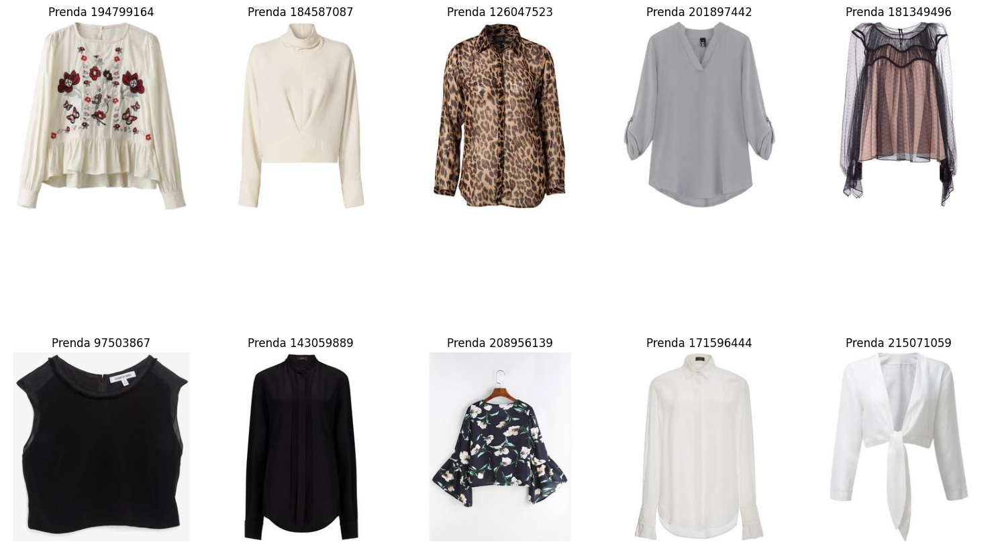


Cluster 1 (390 prendas):
 - Prenda 178910242: tie-neck blouse Flowy fabric, V-neck, Decorative bow, Long sleeve with buttoned cuffs, Side slit hem...
 - Prenda 115700751: cotton blouse Gently tailored blouse in airy cotton with pearly buttons, and long sleeves that can b...
 - Prenda 63966674: full tilt lace back womens Full Tilt shirt. Button front. Allover plaid. Slip chest pocket. Lace bac...
 - Prenda 147300271: long sleeve loose turn-down collar Material:Cotton, Polyester Style:Casual,Modern Collar:V Neck Slee...
 - Prenda 174531482: derek lam 10 crosby striped Black and cream silk striped bell sleeve blouse from Derek Lam 10 Crosby...
 - Prenda 42677194: chic shirt clothing new clothes Chic shirt, Chic clothing, New clothes, Romwe.com Blue shirt Shirt t...
 - Prenda 201152713: dondup checked off shoulder blouse Pink cotton checked off shoulder blouse from Dondup. Color: Pink/...
 - Prenda 100754012: owl pattern chiffon blouse
 - Prenda 197211890: mesh panel floral embroidered bl

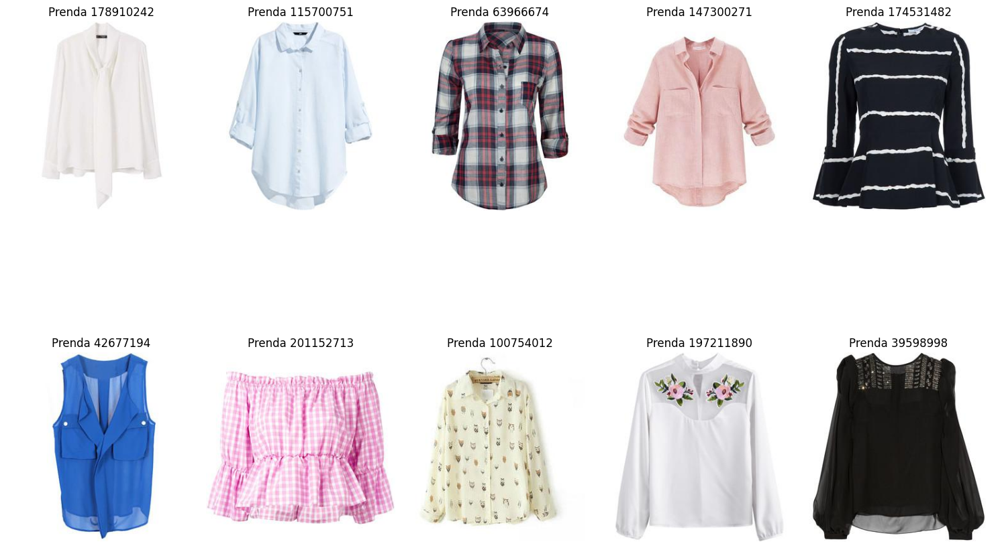


Cluster 2 (768 prendas):
 - Prenda 118413023: shein sheinside white lapel long White Cute Lapel Long Sleeve Polyester Plain Fall Blouses, Size Ava...
 - Prenda 143402157: alexander mcqueen blouse Crêpe No appliqués Solid colour Round collar Short sleeves Rear closure Hoo...
 - Prenda 183743678: spaghetti strap crochet patchwork black Spaghetti Strap Crochet Patchwork Black Blouse Spaghetti Str...
 - Prenda 139424673: mango linen-blend striped blouse Linen and cotton mix, short sleeve, striped print, teardrop fasteni...
 - Prenda 183609068: shein sheinside pink eyelet crochet Pink Beach Round Neck Long Sleeve Polyester Plain Crop Fabric ha...
 - Prenda 173413421: blouse camo
 - Prenda 174891146: high-low printed collarless long sleeve Shop for High-Low Printed Collarless Long Sleeve Blouse at Z...
 - Prenda 204716810: chicwish stripes charisma top with Gotta earn your stripes, babe, and there’s no better way to own t...
 - Prenda 49117062: prabal gurung ruffled blouse Deep v-neck long 

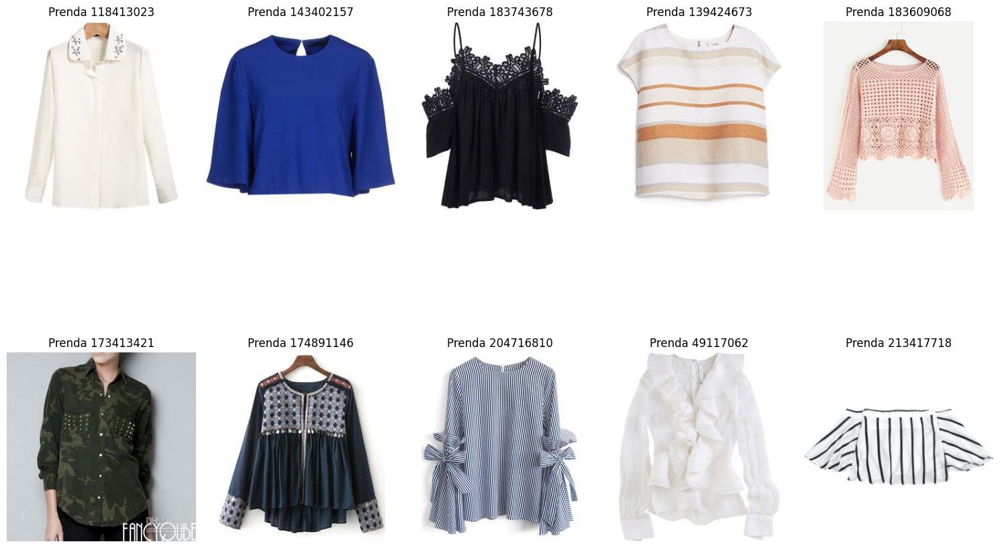


Cluster 3 (1337 prendas):
 - Prenda 22653517: charlie
 - Prenda 204298322: rosie assoulin asymmetric ruffled blouse Navy blue and white cotton blend asymmetric ruffled blouse ...
 - Prenda 169480508: blumarine blouse
 - Prenda 213469439: spaghetti strap ruffle blouse yellow
 - Prenda 191199166: stella mccartney striped cotton-blend blouse Stella McCartney's blouse is cut from airy cotton-blend...
 - Prenda 200044782: oscar de la renta metallic Bringing Oscar de la Renta’s refined femininity to evening looks, this to...
 - Prenda 164167001: rodarte chantilly lace draped blouse
 - Prenda 211024550: leaves print neck self tie
 - Prenda 149524212: cushnie et ochs pearl-trimmed silk-georgette
 - Prenda 210758800: zimmermann sleeveless lace blouse BLACK Natural (Vegetable)->Cotton Sleeveless Lace Blouse from Zimm...
  Mostrando 10 imágenes del cluster 3:


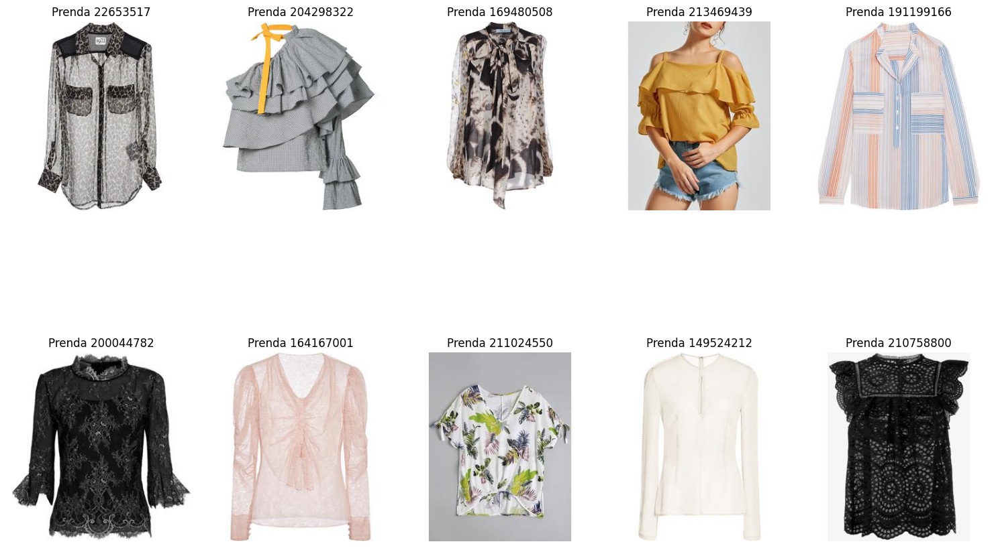


Cluster 4 (115 prendas):
 - Prenda 179791046: croosover poplin blouse Premium Collection, Cotton poplin, Crossover design, V-neck, Short sleeve, S...
 - Prenda 209360524: mogul womens red tank top
 - Prenda 169841987: caroline constas carmen off shoulder From the emerging New York-based designer comes this *Caroline ...
 - Prenda 213367105: beauty youth slit detail strapless
 - Prenda 205175954: tribal print off shoulder cropped Shop for Tribal Print Off The Shoulder Cropped Blouse at ZAFUL. Fr...
 - Prenda 207732252: lace insert chiffon high low
 - Prenda 208671438: ruffled stripe-patterned blouse Cotton fabric, Combined flowers and striped print, Decortive frill d...
 - Prenda 146349994: white lapel vertical striped self-tie White Lapel Vertical Striped Self-Tie Blouse Size Available :S...
 - Prenda 180506123: luisa beccaria chiffon printed peasant This *Luisa Beccaria** top features an off the shoulder neckl...
 - Prenda 207274455: vita kin all stars embroidered Vita Kin's white li

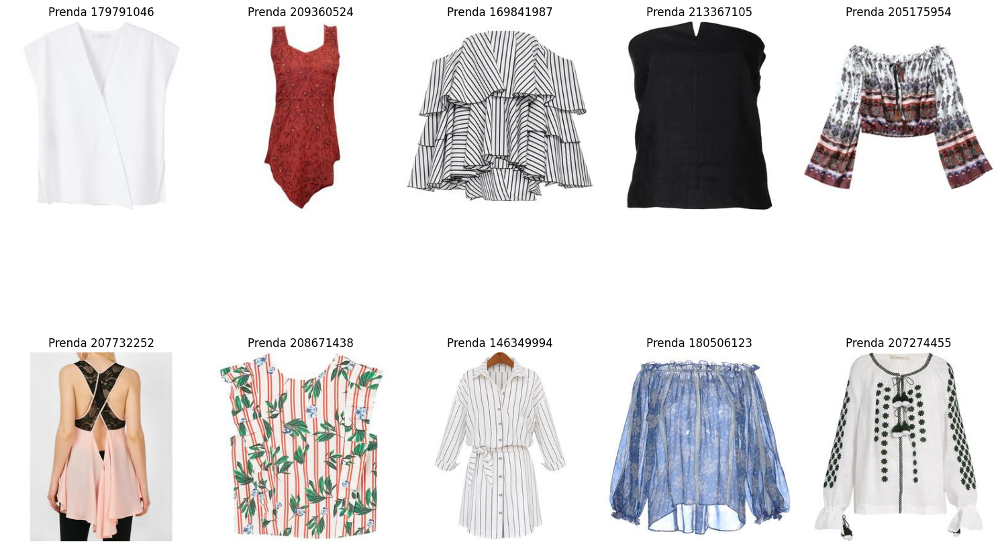


Cluster 5 (9 prendas):
 - Prenda 213547342: alexis regine white ruffled gypsy
 - Prenda 171629819: see-through embroidery shirt collar butterfly
 - Prenda 214968679: marissa webb coralie bow ties This Coralie button-up by Marissa Webb breaks all the rules with backl...
 - Prenda 183786563: volantbluse 39 99 Blau/Gestreift. Baumwollbluse mit kurzem Stehkragen, verdeckter Knopfleiste und le...
 - Prenda 183650930: shein sheinside burgundy crochet insert
 - Prenda 189860013: sequined neck asymmetric blouse
 - Prenda 148680591: lighting day blouse
 - Prenda 211823124: square neck striped smocked babydoll Shop for Square Neck Striped Smocked Babydoll Top BLUE: Blouses...
 - Prenda 210360230: lace trim cold shoulder blouse
  Mostrando 9 imágenes del cluster 5:


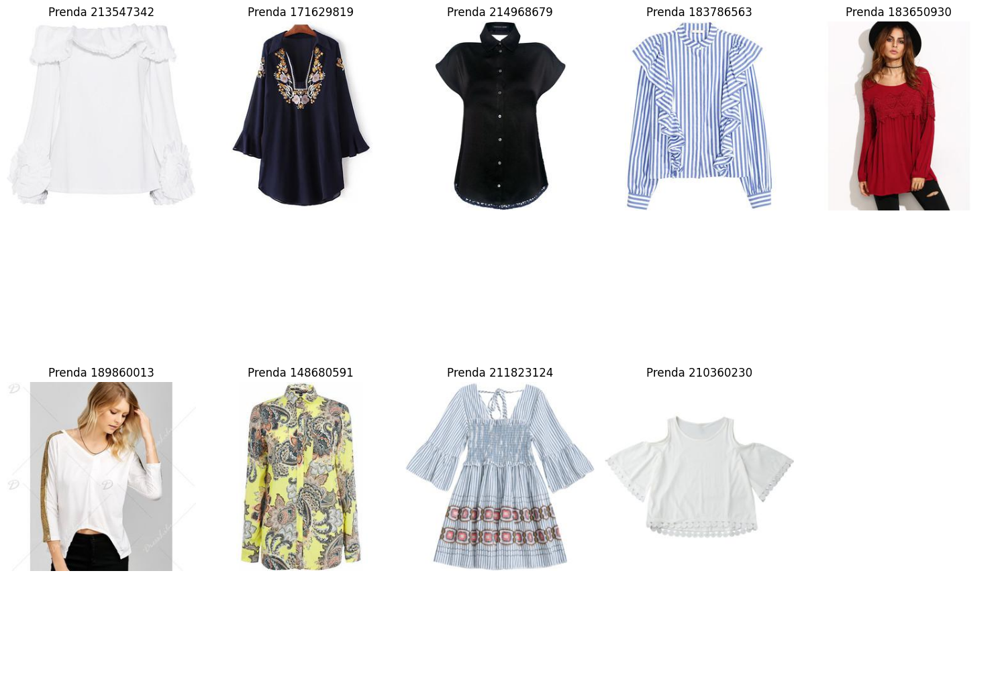


Cluster 6 (19 prendas):
 - Prenda 142813040: long-sleeved pintuck blouse
 - Prenda 208988201: off-the-shoulder blouse 19.99
 - Prenda 207431755: back slit stand neck sleeve
 - Prenda 182827779: striped off shoulder cropped blouse
 - Prenda 210958041: pinstripe flounce blouse Cheap Blue S Blouses&Shirts online, Gamiss offers you Pinstripe Flounce Blo...
 - Prenda 202605052: river island grey stripe oversized
 - Prenda 200277894: adjustable sleeves blouse
 - Prenda 100819915: giambattista valli ruffle overlay blouse Giambattista Valli Ruffle Overlay Blouse Giambattista Valli...
 - Prenda 208255290: brooks brothers gingham cotton poplin
 - Prenda 188712913: boat neck gingham check blouse Fashion Clothing Site with greatest number of Latest casual style Dre...
  Mostrando 10 imágenes del cluster 6:


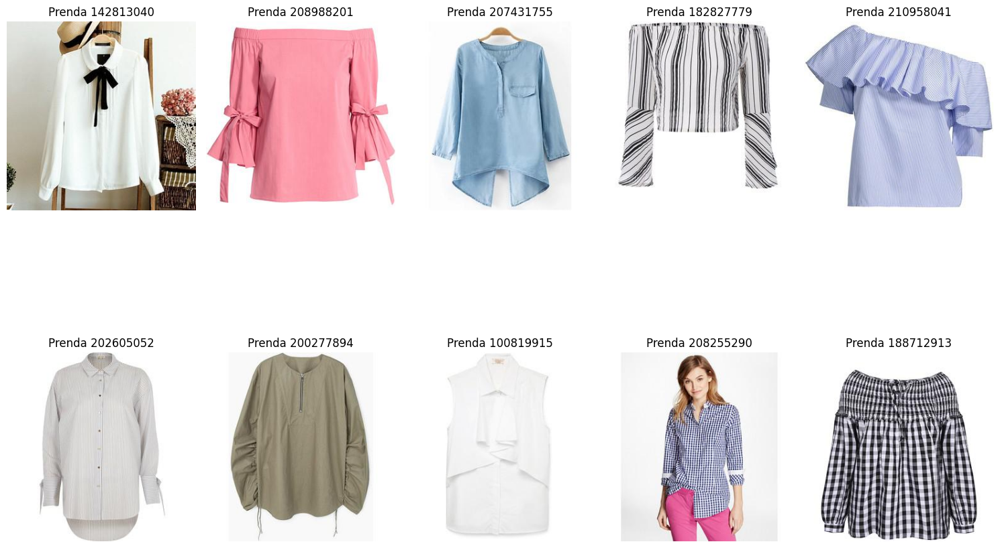


Cluster 7 (10 prendas):
 - Prenda 198226245: silk blouse 49.99
 - Prenda 170617221: trendy womens ethnic print neck
 - Prenda 207098186: neck ruched belted blouse
 - Prenda 181288959: shein sheinside brown long sleeve
 - Prenda 59554867: equipment cheetah-print silk blouse
 - Prenda 194646860: mafalda von hessen neck-tie silk
 - Prenda 198386093: shein sheinside navy bow front
 - Prenda 59628406: charvet ファッション誌『VOGUE JAPAN』の公式サイト。『VOGUE JAPAN』で掲載されたファッションアイテムの検索ページ。ファッションアイテム名からはもちろん、ファッションブランド...
 - Prenda 40593205: to be chic %E3%82%B3%E3%83%83%E3%83%88%E3%83%B3%E3%82%B7%E3%83%AB%E3%82%AF %E3%82%B8%E3%83%A3%E3%83%...
 - Prenda 82144796: elegant large turndown collar solid
  Mostrando 10 imágenes del cluster 7:


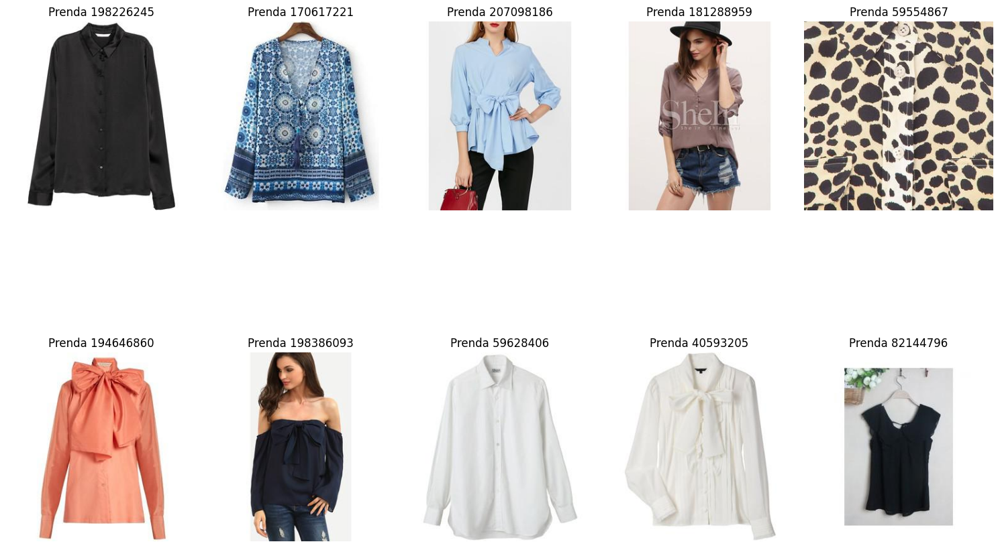


Cluster 8 (9 prendas):
 - Prenda 212395339: mania blouse
 - Prenda 207603339: blouse %C3%A9paules nues imprim%C3%A9e Blouse Épaules Nues Imprimée à découvrir ici et faites vos ac...
 - Prenda 203051828: loewe crystal dot blouse
 - Prenda 60803551: soaked in luxury top plura
 - Prenda 192748138: checked neck high low blouse
 - Prenda 211032149: lace-collared blouse 24.99 Naturweiß. Ärmellose Bluse aus Viskose mit Spitzenkragen. Die Bluse ist l...
 - Prenda 204084662: maison margiela pleated front sleeveless
 - Prenda 208107867: halcyon days blouse
 - Prenda 213898649: tropical print knot front blouse
  Mostrando 9 imágenes del cluster 8:


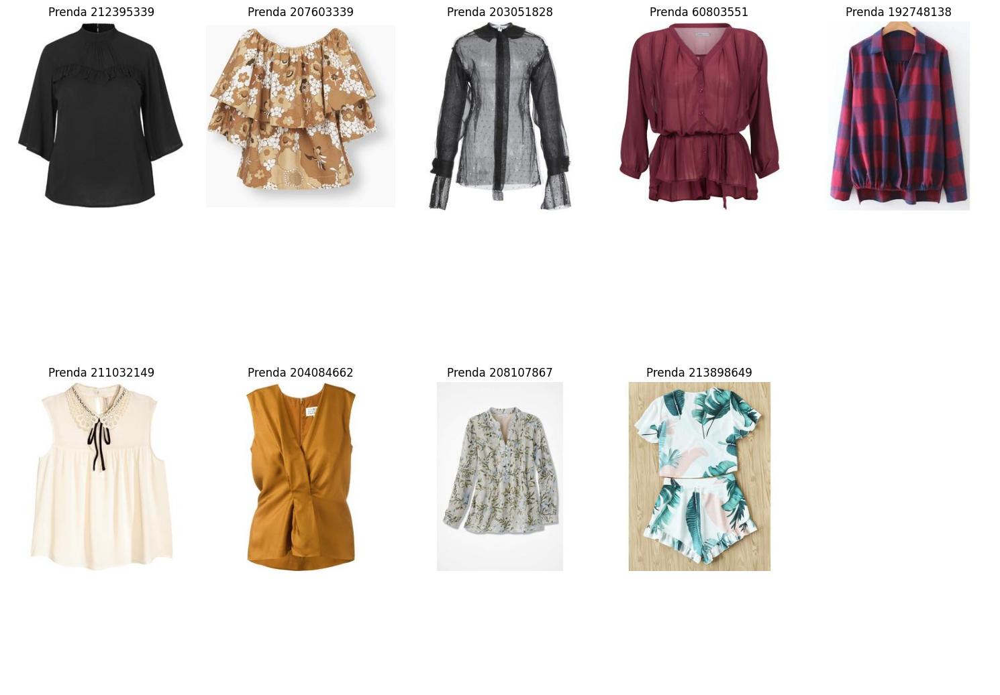


Cluster 9 (3 prendas):
 - Prenda 177072516: cinq sept stardust rowan floral-print
 - Prenda 126844526: violeta mango monochrome soft blouse
 - Prenda 143988286: mid-length short sleeves surprise tea
  Mostrando 3 imágenes del cluster 9:


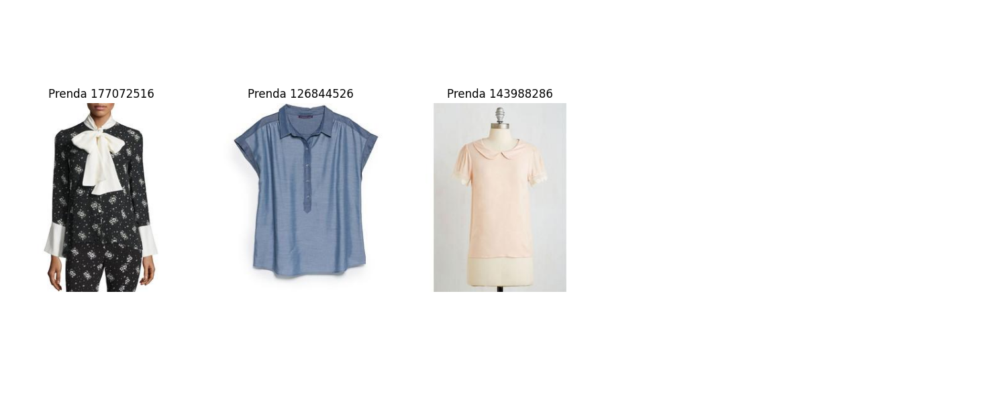


Cluster 10 (3 prendas):
 - Prenda 24408972: elle shops Shopping Guide Topic: ELLE-Shops-The-Classics Page .ELLE.com experts show you where to sh...
 - Prenda 101156182: wunderkind lilac blue bow blouse Locker geschnittene Bluse mit rundem, halsfernem Kragen und langen ...
 - Prenda 214363023: preowned saint laurent rive gauche
  Mostrando 3 imágenes del cluster 10:


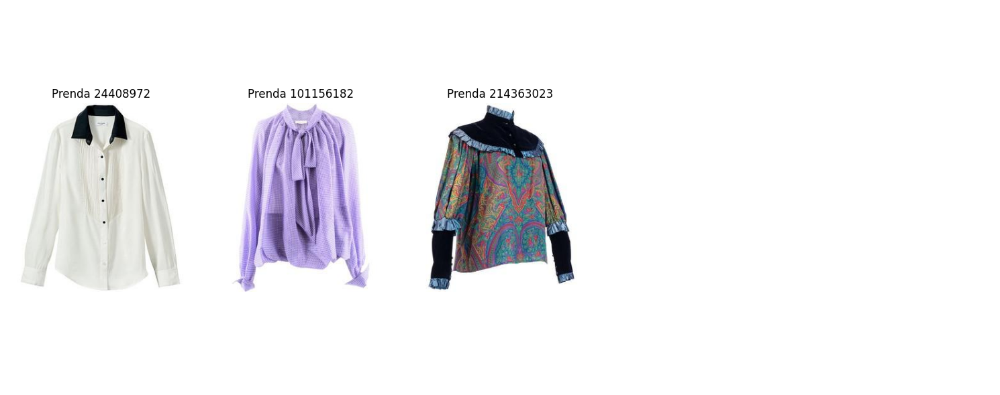


Cluster 12 (1 prendas):
 - Prenda 79206234: boy band outsiders printed boat
  Mostrando 1 imágenes del cluster 12:


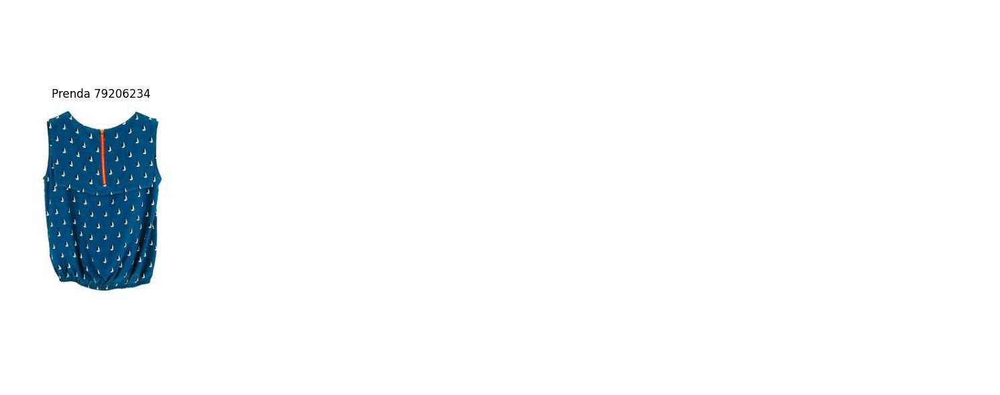


Cluster 30 (1 prendas):
 - Prenda 197937556: printed chiffon asymmetric plus size
  Mostrando 1 imágenes del cluster 30:


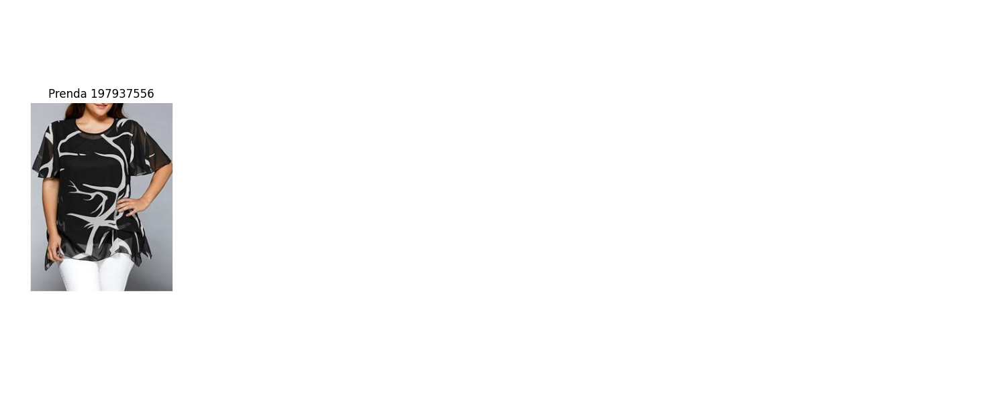


Cluster 49 (1 prendas):
 - Prenda 149514032: amazon.com iron fist womens creepers
  Mostrando 1 imágenes del cluster 49:


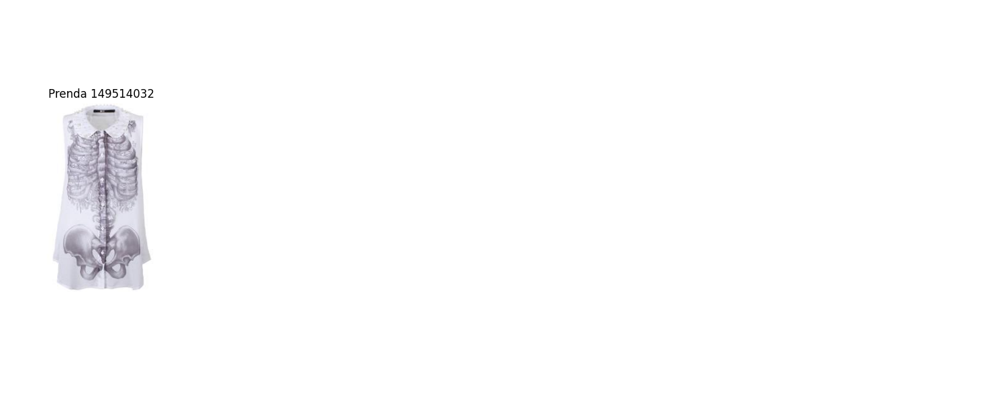


Cluster 75 (1 prendas):
 - Prenda 97781397: orla kiely solid crepe blouse Classic blouse in crepe fabric. This blouse has a large collar and an ...
  Mostrando 1 imágenes del cluster 75:


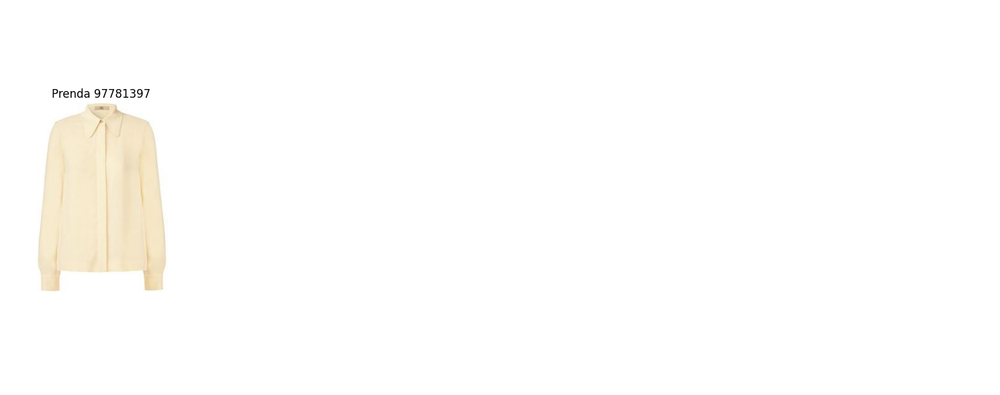

In [26]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import defaultdict

# Configuración de rutas
METADATA_PATH = "datasets/polyvore/item_metadata.json"
OUTPUT_DIR = "hlda_outputs"
SUBCATEGORY = "tops"  # Subcategoría semántica
CATEGORY_ID = 17    # Subcategoría específica (ajusta según tus datos, por ejemplo, cat15)

def load_metadata():
    """Carga los metadatos de las prendas."""
    try:
        with open(METADATA_PATH, 'r') as f:
            metadata = json.load(f)
        metadata_dict = {str(item['item_id']): item for item in metadata}
        print(f"Cargados {len(metadata_dict)} metadatos de prendas")
        return metadata_dict
    except FileNotFoundError as e:
        print(f"No se encontró {METADATA_PATH}: {e}")
        raise
    except json.JSONDecodeError as e:
        print(f"Error al decodificar {METADATA_PATH}: {e}")
        raise

def get_item_description(item):
    """Concatena todas las entradas de texto de una prenda."""
    fields = ['url_name', 'description', 'title', 'categories', 'related']
    parts = []
    for field in fields:
        value = item.get(field, '')
        if isinstance(value, list):
            value = ' '.join(str(v) for v in value)
        if value:
            parts.append(value)
    return ' '.join(parts)[:100] + "..." if len(' '.join(parts)) > 100 else ' '.join(parts)

def show_cluster_examples():
    """Muestra 10 ejemplos de prendas por cluster y visualiza sus imágenes."""
    # Cargar metadatos
    metadata = load_metadata()
    
    # Ruta al CSV de la subcategoría
    csv_path = os.path.join(OUTPUT_DIR, SUBCATEGORY, f'cat{CATEGORY_ID}_hdp_clusters.csv')
    
    try:
        clusters_df = pd.read_csv(csv_path)
        print(f"Cargado {csv_path} con {len(clusters_df)} prendas")
    except FileNotFoundError:
        print(f"No se encontró {csv_path}. Verifica CATEGORY_ID o si los CSVs se generaron.")
        print("CSVs disponibles en hlda_outputs/tops/:")
        import glob
        csv_files = glob.glob(os.path.join(OUTPUT_DIR, SUBCATEGORY, "cat*.csv"))
        print([os.path.basename(f) for f in csv_files])
        return
    
    # Agrupar por cluster
    clusters = defaultdict(list)
    for _, row in clusters_df.iterrows():
        item_id = str(row['item_id'])
        cluster_id = row['cluster']
        if item_id in metadata:
            clusters[cluster_id].append((item_id, metadata[item_id]))
    
    # Mostrar ejemplos y visualizar
    for cluster_id in sorted(clusters.keys()):
        if cluster_id == -1:  # Saltar prendas sin cluster asignado
            continue
        print(f"\nCluster {cluster_id} ({len(clusters[cluster_id])} prendas):")
        
        # Mostrar hasta 10 ejemplos
        examples = clusters[cluster_id][:10]
        for item_id, item in examples:
            description = get_item_description(item)
            print(f" - Prenda {item_id}: {description}")
        
        # Visualizar imágenes
        num_items_to_show = min(10, len(examples))
        if num_items_to_show == 0:
            print("  No hay prendas para visualizar en este cluster.")
            continue
        
        images_per_row = 5
        num_rows = (num_items_to_show + images_per_row - 1) // images_per_row
        fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, 6 * num_rows))
        # Asegurar que axes sea un array 1D de Axes objects
        axes = axes.flatten() if num_rows * images_per_row > 1 else [axes] if num_items_to_show == 1 else axes
        
        print(f"  Mostrando {num_items_to_show} imágenes del cluster {cluster_id}:")
        for i, (item_id, _) in enumerate(examples):
            image_path = f"datasets/polyvore/images/{item_id}.jpg"
            try:
                img = mpimg.imread(image_path)
                axes[i].imshow(img)
                axes[i].set_title(f"Prenda {item_id}")
                axes[i].axis('off')
            except Exception as e:
                axes[i].text(0.5, 0.5, f"No se pudo cargar\nPrenda {item_id}\n{e}",
                             ha='center', va='center', fontsize=10, color='red')
                axes[i].axis('off')
        
        # Ocultar ejes vacíos
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')
        
        plt.tight_layout()
        plt.show()

# Ejecutar
show_cluster_examples()

In [18]:
import os
import json
import pandas as pd
from collections import defaultdict

# Configuración de rutas
METADATA_PATH = "datasets/polyvore/item_metadata.json"
OUTPUT_DIR = "hlda_outputs"

def load_metadata():
    """Carga los metadatos de las prendas."""
    try:
        with open(METADATA_PATH, 'r') as f:
            metadata = json.load(f)
        metadata_dict = {str(item['item_id']): item for item in metadata}
        print(f"Cargados {len(metadata_dict)} metadatos de prendas")
        return metadata_dict
    except FileNotFoundError as e:
        print(f"No se encontró {METADATA_PATH}: {e}")
        raise
    except json.JSONDecodeError as e:
        print(f"Error al decodificar {METADATA_PATH}: {e}")
        raise

def count_cluster_assignments():
    """Cuenta las prendas asignadas a clusters y muestra la distribución por cluster."""
    # Cargar metadatos
    metadata = load_metadata()
    all_item_ids = set(metadata.keys())
    
    # Recopilar asignaciones de clusters
    assigned_items = defaultdict(list)  # (semantic_cat, category_id) -> [(item_id, cluster)]
    cluster_counts = defaultdict(lambda: defaultdict(int))  # (semantic_cat, category_id) -> cluster -> count
    cluster_minus_one_counts = defaultdict(int)  # (semantic_cat, category_id) -> count for -1
    total_assigned = set()
    
    # Recorrer todos los CSVs en hlda_outputs
    for semantic_cat in os.listdir(OUTPUT_DIR):
        semantic_dir = os.path.join(OUTPUT_DIR, semantic_cat)
        if not os.path.isdir(semantic_dir):
            continue
        for csv_file in os.listdir(semantic_dir):
            if csv_file.endswith("_hdp_clusters.csv"):
                try:
                    category_id = int(csv_file.replace("cat", "").replace("_hdp_clusters.csv", ""))
                except ValueError:
                    continue
                csv_path = os.path.join(semantic_dir, csv_file)
                try:
                    df = pd.read_csv(csv_path)
                    for _, row in df.iterrows():
                        item_id = str(row['item_id'])
                        cluster_id = row['cluster']
                        assigned_items[(semantic_cat, category_id)].append((item_id, cluster_id))
                        cluster_counts[(semantic_cat, category_id)][cluster_id] += 1
                        total_assigned.add(item_id)
                        if cluster_id == -1:
                            cluster_minus_one_counts[(semantic_cat, category_id)] += 1
                except Exception as e:
                    print(f"Error al leer {csv_path}: {e}")
    
    # Prendas no asignadas
    unassigned_items = all_item_ids - total_assigned
    
    # Imprimir resumen general
    print("\n=== Resumen de Asignación de Clusters ===")
    print(f"Total de prendas en item_metadata.json: {len(all_item_ids)}")
    print(f"Prendas asignadas a un cluster: {len(total_assigned)} ({len(total_assigned)/len(all_item_ids)*100:.2f}%)")
    print(f"Prendas no asignadas: {len(unassigned_items)} ({len(unassigned_items)/len(all_item_ids)*100:.2f}%)")
    if unassigned_items:
        print(f"Ejemplo de prendas no asignadas (hasta 10): {list(unassigned_items)[:10]}")
    
    total_minus_one = sum(cluster_minus_one_counts.values())
    print(f"\nTotal de prendas en cluster basura (-1): {total_minus_one} ({total_minus_one/len(total_assigned)*100:.2f}% de las asignadas)")
    
    # Detalle por categoría semántica y subcategoría
    print("\n=== Distribución de Prendas por Categoría, Subcategoría y Cluster ===")
    for (semantic_cat, category_id), items in sorted(assigned_items.items()):
        total_in_category = len(items)
        minus_one_count = cluster_minus_one_counts.get((semantic_cat, category_id), 0)
        print(f"\n{semantic_cat}/cat{category_id}:")
        print(f" - Total de prendas asignadas: {total_in_category}")
        print(f" - Prendas en cluster basura (-1): {minus_one_count} ({minus_one_count/total_in_category*100:.2f}%)")
        print(f" - Prendas en clusters válidos: {total_in_category - minus_one_count}")
        print(" - Distribución por cluster:")
        for cluster_id in sorted(cluster_counts[(semantic_cat, category_id)].keys()):
            count = cluster_counts[(semantic_cat, category_id)][cluster_id]
            print(f"   - Cluster {cluster_id}: {count} prendas ({count/total_in_category*100:.2f}%)")

# Ejecutar
count_cluster_assignments()

Cargados 251008 metadatos de prendas

=== Resumen de Asignación de Clusters ===
Total de prendas en item_metadata.json: 251008
Prendas asignadas a un cluster: 251008 (100.00%)
Prendas no asignadas: 0 (0.00%)

Total de prendas en cluster basura (-1): 0 (0.00% de las asignadas)

=== Distribución de Prendas por Categoría, Subcategoría y Cluster ===

accessories/cat52:
 - Total de prendas asignadas: 1815
 - Prendas en cluster basura (-1): 0 (0.00%)
 - Prendas en clusters válidos: 1815
 - Distribución por cluster:
   - Cluster 0: 640 prendas (35.26%)
   - Cluster 1: 203 prendas (11.18%)
   - Cluster 2: 390 prendas (21.49%)
   - Cluster 3: 493 prendas (27.16%)
   - Cluster 4: 27 prendas (1.49%)
   - Cluster 5: 14 prendas (0.77%)
   - Cluster 6: 11 prendas (0.61%)
   - Cluster 7: 12 prendas (0.66%)
   - Cluster 8: 6 prendas (0.33%)
   - Cluster 9: 6 prendas (0.33%)
   - Cluster 10: 1 prendas (0.06%)
   - Cluster 11: 1 prendas (0.06%)
   - Cluster 13: 3 prendas (0.17%)
   - Cluster 14: 1 prend

## Creamos diccionarios de los clusters para el entrenamiento

In [19]:
import os
import pandas as pd
import numpy as np
from collections import defaultdict
import pickle

# Ruta base donde están los CSV y donde se guardarán los diccionarios
BASE_OUTPUT_DIR = "hlda_outputs"

def build_cluster_dictionaries(base_dir):
    """
    Construye tres diccionarios a partir de los CSV de clusters HDP:
    - item_to_info: Mapea item_id a su semantic_category, category_id y cluster_id.
    - cluster_to_items: Mapea (semantic_category, category_id, cluster_id) a una lista de item_id.
    - category_to_clusters: Mapea (semantic_category, category_id) a un conjunto de cluster_id.
    """
    item_to_info = {}
    cluster_to_items = defaultdict(list)
    category_to_clusters = defaultdict(set)
    
    # Recorrer todas las carpetas dentro de hlda_outputs (cada carpeta es una semantic_category)
    for semantic_cat in os.listdir(base_dir):
        semantic_dir = os.path.join(base_dir, semantic_cat)
        if not os.path.isdir(semantic_dir):
            continue
        
        # Recorrer todos los archivos CSV dentro de la carpeta semantic_category
        for filename in os.listdir(semantic_dir):
            if not filename.endswith('_hdp_clusters.csv'):
                continue
            
            # Extraer category_id del nombre del archivo (por ejemplo, cat15_hdp_clusters.csv -> 15)
            category_id_str = filename.replace('cat', '').replace('_hdp_clusters.csv', '')
            try:
                category_id = int(category_id_str)
            except ValueError:
                continue
            
            # Leer el CSV
            filepath = os.path.join(semantic_dir, filename)
            try:
                df = pd.read_csv(filepath)
            except Exception as e:
                print(f"Error al leer {filepath}: {e}")
                continue
            
            # Procesar cada fila del CSV
            for _, row in df.iterrows():
                item_id = str(row['item_id'])  # Asegurarnos de que item_id sea string
                cluster_id = int(row['cluster'])
                
                # Añadir al diccionario item_to_info
                item_to_info[item_id] = {
                    'semantic_category': semantic_cat,
                    'category_id': category_id,
                    'cluster_id': cluster_id
                }
                
                # Añadir al diccionario cluster_to_items
                cluster_key = (semantic_cat, category_id, cluster_id)
                cluster_to_items[cluster_key].append(item_id)
                
                # Añadir al diccionario category_to_clusters
                category_key = (semantic_cat, category_id)
                category_to_clusters[category_key].add(cluster_id)
    
    print(f"Se procesaron {len(item_to_info)} prendas en total.")
    print(f"Se encontraron {len(cluster_to_items)} combinaciones de (semantic_category, category_id, cluster_id).")
    print(f"Se encontraron {len(category_to_clusters)} combinaciones de (semantic_category, category_id).")
    return item_to_info, cluster_to_items, category_to_clusters

def sample_negatives_from_different_clusters(positive_item_id, item_to_info, cluster_to_items, category_to_clusters, num_negatives=5):
    """
    Dado un item_id positivo, samplea negativos de la misma semantic_category y category_id
    pero de distintos clusters al del positivo.
    
    Args:
        positive_item_id (str): ID de la prenda positiva.
        item_to_info (dict): Diccionario que mapea item_id a su información.
        cluster_to_items (dict): Diccionario que mapea (semantic_category, category_id, cluster_id) a item_id.
        category_to_clusters (dict): Diccionario que mapea (semantic_category, category_id) a un conjunto de cluster_id.
        num_negatives (int): Número de negativos a samplear.
    
    Returns:
        list: Lista de item_id de negativos sampleados.
    """
    # Obtener la información del positivo
    if positive_item_id not in item_to_info:
        raise ValueError(f"Item ID {positive_item_id} no encontrado en item_to_info.")
    
    info = item_to_info[positive_item_id]
    semantic_cat = info['semantic_category']
    category_id = info['category_id']
    positive_cluster = info['cluster_id']
    
    # Obtener todos los cluster_id disponibles para esta semantic_category y category_id
    category_key = (semantic_cat, category_id)
    if category_key not in category_to_clusters:
        print(f"No se encontraron clusters para {semantic_cat}/{category_id}.")
        return []
    
    all_clusters = category_to_clusters[category_key]
    # Excluir el cluster del positivo
    possible_clusters = [cluster_id for cluster_id in all_clusters if cluster_id != positive_cluster]
    
    if not possible_clusters:
        print(f"No se encontraron clusters distintos para {semantic_cat}/{category_id}.")
        return []
    
    # Samplear negativos de los clusters distintos
    negatives = []
    for _ in range(num_negatives):
        # Elegir un cluster aleatorio de los posibles
        cluster_id = possible_clusters[np.random.randint(len(possible_clusters))]
        cluster_key = (semantic_cat, category_id, cluster_id)
        items_in_cluster = cluster_to_items[cluster_key]
        
        # Samplear un item aleatorio de ese cluster
        negative_item = np.random.choice(items_in_cluster)
        negatives.append(negative_item)
    
    return negatives

def main():
    # Construir los diccionarios a partir de los CSV
    print("Construyendo diccionarios a partir de los CSV de HDP...")
    item_to_info, cluster_to_items, category_to_clusters = build_cluster_dictionaries(BASE_OUTPUT_DIR)
    
    # Ejemplo de uso: Samplear negativos para un item_id positivo
    # Cambia '211990161' por un item_id válido de tus CSVs (por ejemplo, de tops/cat15)
    positive_item_id = '211990161'
    try:
        negatives = sample_negatives_from_different_clusters(
            positive_item_id, item_to_info, cluster_to_items, category_to_clusters, num_negatives=5
        )
        print(f"\nNegativos sampleados para item_id = {positive_item_id}:")
        for neg in negatives:
            print(f"- {neg} (Cluster: {item_to_info[neg]['cluster_id']})")
    except ValueError as e:
        print(f"Error: {e}")
        print("Prueba con un item_id presente en los CSVs, por ejemplo:")
        print(list(item_to_info.keys())[:5])  # Mostrar 5 item_id válidos
    
    # Guardar los diccionarios dentro de la carpeta hlda_outputs
    with open(os.path.join(BASE_OUTPUT_DIR, 'item_to_info_hdp.pkl'), 'wb') as f:
        pickle.dump(item_to_info, f)
    with open(os.path.join(BASE_OUTPUT_DIR, 'cluster_to_items_hdp.pkl'), 'wb') as f:
        pickle.dump(cluster_to_items, f)
    with open(os.path.join(BASE_OUTPUT_DIR, 'category_to_clusters_hdp.pkl'), 'wb') as f:
        pickle.dump(category_to_clusters, f)
    print(f"\nDiccionarios guardados en '{BASE_OUTPUT_DIR}' como 'item_to_info_hdp.pkl', 'cluster_to_items_hdp.pkl' y 'category_to_clusters_hdp.pkl'.")

if __name__ == "__main__":
    main()

Construyendo diccionarios a partir de los CSV de HDP...
Se procesaron 251008 prendas en total.
Se encontraron 2160 combinaciones de (semantic_category, category_id, cluster_id).
Se encontraron 153 combinaciones de (semantic_category, category_id).

Negativos sampleados para item_id = 211990161:
- 109440813 (Cluster: 1)
- 71916103 (Cluster: 9)
- 171154878 (Cluster: 5)
- 210229514 (Cluster: 8)
- 172617949 (Cluster: 8)

Diccionarios guardados en 'hlda_outputs' como 'item_to_info_hdp.pkl', 'cluster_to_items_hdp.pkl' y 'category_to_clusters_hdp.pkl'.


Loaded 53306 outfits from datasets/polyvore/nondisjoint/train.json
Diccionarios cargados desde kmeans:
- item_to_info: 251008 prendas
- cluster_to_items: 2160 combinaciones
- category_to_clusters: 153 combinaciones

Outfit seleccionado: set_id = 219064623, items = [200948689, 197196143, 203042119, 204490525]
Ítem quitado: 204490525
Ítems restantes: [200948689, 197196143, 203042119]

Mostrando el outfit original (incluyendo el ítem quitado):


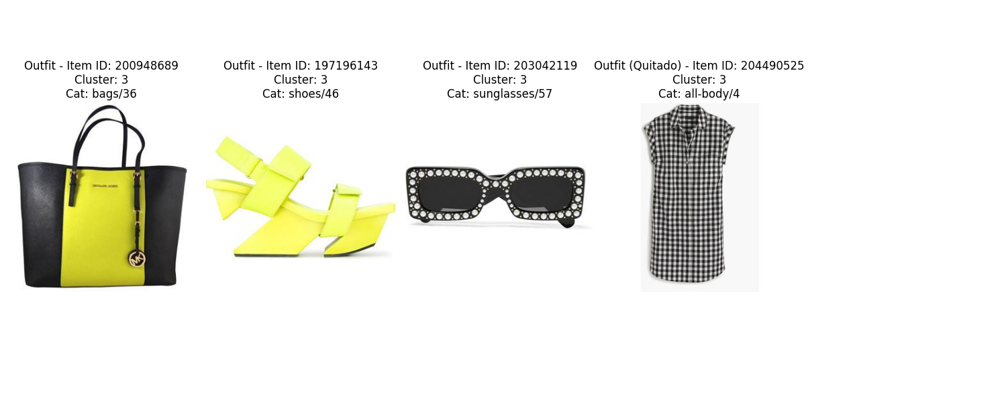


Negativos sampleados para el ítem quitado (204490525):

Mostrando los negativos sampleados:


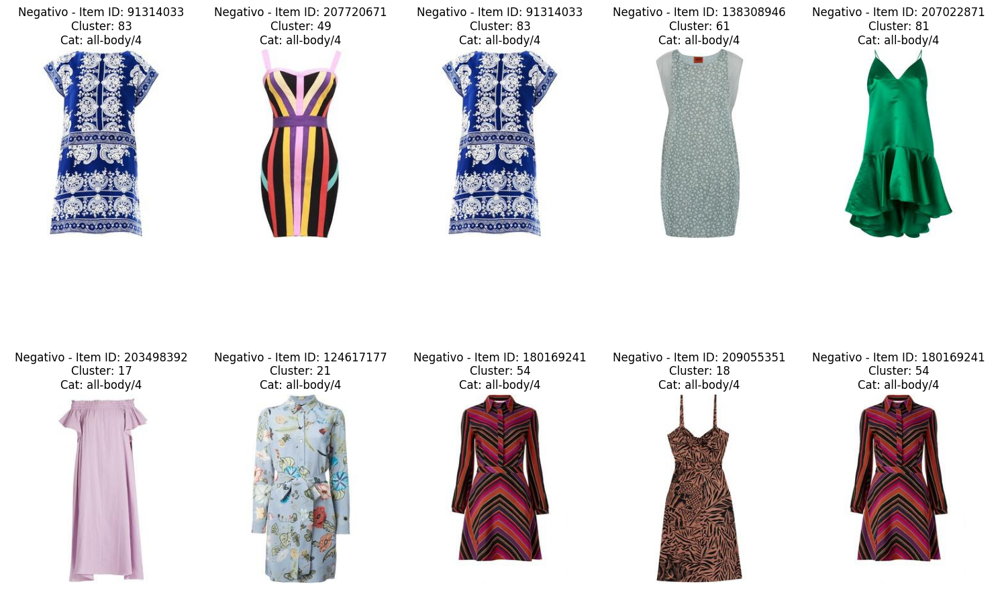

In [24]:

# Paso 4: Importar las bibliotecas necesarias
import os
import json
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import defaultdict

# Rutas a los archivos
TRAIN_JSON_PATH = "datasets/polyvore/nondisjoint/train.json"
BASE_OUTPUT_DIR = "hlda_outputs"

def load_outfits(json_path):
    """Carga los outfits desde el archivo JSON."""
    with open(json_path, 'r') as f:
        outfits = json.load(f)
    print(f"Loaded {len(outfits)} outfits from {json_path}")
    return outfits

def load_dictionaries(base_dir):
    """Carga los diccionarios desde los archivos pickle."""
    with open(os.path.join(base_dir, 'item_to_info.pkl'), 'rb') as f:
        item_to_info = pickle.load(f)
    with open(os.path.join(base_dir, 'cluster_to_items.pkl'), 'rb') as f:
        cluster_to_items = pickle.load(f)
    with open(os.path.join(base_dir, 'category_to_clusters.pkl'), 'rb') as f:
        category_to_clusters = pickle.load(f)
    print("Diccionarios cargados desde kmeans:")
    print(f"- item_to_info: {len(item_to_info)} prendas")
    print(f"- cluster_to_items: {len(cluster_to_items)} combinaciones")
    print(f"- category_to_clusters: {len(category_to_clusters)} combinaciones")
    return item_to_info, cluster_to_items, category_to_clusters

def sample_negatives_from_different_clusters(positive_item_id, item_to_info, cluster_to_items, category_to_clusters, num_negatives=10):
    """
    Dado un item_id positivo, samplea negativos de la misma semantic_category y category_id
    pero de distintos clusters al del positivo.
    """
    if positive_item_id not in item_to_info:
        raise ValueError(f"Item ID {positive_item_id} no encontrado en item_to_info.")
    
    info = item_to_info[positive_item_id]
    semantic_cat = info['semantic_category']
    category_id = info['category_id']
    positive_cluster = info['cluster_id']
    
    category_key = (semantic_cat, category_id)
    if category_key not in category_to_clusters:
        print(f"No se encontraron clusters para {semantic_cat}/{category_id}.")
        return []
    
    all_clusters = category_to_clusters[category_key]
    possible_clusters = [cluster_id for cluster_id in all_clusters if cluster_id != positive_cluster]
    
    if not possible_clusters:
        print(f"No se encontraron clusters distintos para {semantic_cat}/{category_id}.")
        return []
    
    negatives = []
    for _ in range(num_negatives):
        cluster_id = possible_clusters[np.random.randint(len(possible_clusters))]
        cluster_key = (semantic_cat, category_id, cluster_id)
        items_in_cluster = cluster_to_items[cluster_key]
        negative_item = np.random.choice(items_in_cluster)
        negatives.append(negative_item)
    
    return negatives

def display_items(item_ids, item_to_info, title_prefix="", removed_item=None):
    """Muestra las imágenes de los ítems con información de sus clusters."""
    num_items = len(item_ids)
    images_per_row = 5
    num_rows = (num_items + images_per_row - 1) // images_per_row
    
    # Crear la cuadrícula de subgráficos
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, 6 * num_rows))
    
    # Asegurarnos de que axes sea siempre un array unidimensional de objetos Axes
    if num_rows == 1 and num_items == 1:
        axes = np.array([axes])
    elif num_rows == 1:
        axes = axes.flatten() if isinstance(axes, np.ndarray) else np.array(axes)
    else:
        axes = axes.flatten()
    
    for i, item_id in enumerate(item_ids):
        image_path = f"datasets/polyvore/images/{item_id}.jpg"
        # Determinar el prefijo del título según si el ítem es el quitado
        prefix = title_prefix
        if removed_item is not None and str(item_id) == str(removed_item):
            prefix = "Outfit (Quitado) - "
        else:
            prefix = title_prefix
        
        try:
            img = mpimg.imread(image_path)
            axes[i].imshow(img)
            info = item_to_info.get(str(item_id), {})
            cluster_info = f"Cluster: {info.get('cluster_id', 'N/A')}\n" \
                          f"Cat: {info.get('semantic_category', 'N/A')}/{info.get('category_id', 'N/A')}"
            axes[i].set_title(f"{prefix}Item ID: {item_id}\n{cluster_info}")
            axes[i].axis('off')
        except Exception as e:
            axes[i].text(0.5, 0.5, f"No se pudo cargar\nItem ID: {item_id}\n{e}",
                         ha='center', va='center', fontsize=10, color='red')
            axes[i].axis('off')
    
    # Ocultar ejes vacíos
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

def main():
    # Cargar los outfits
    outfits = load_outfits(TRAIN_JSON_PATH)
    
    # Cargar los diccionarios
    item_to_info, cluster_to_items, category_to_clusters = load_dictionaries(BASE_OUTPUT_DIR)
    
    # Samplear un outfit aleatorio
    random_outfit = np.random.choice(outfits)
    set_id = random_outfit['set_id']
    outfit_items = random_outfit['item_ids']
    print(f"\nOutfit seleccionado: set_id = {set_id}, items = {outfit_items}")
    
    # Seleccionar un ítem aleatorio para quitar
    removed_item = np.random.choice(outfit_items)
    remaining_items = [item for item in outfit_items if item != removed_item]
    print(f"Ítem quitado: {removed_item}")
    print(f"Ítems restantes: {remaining_items}")
    
    # Mostrar el outfit original (incluyendo el ítem quitado)
    print("\nMostrando el outfit original (incluyendo el ítem quitado):")
    display_items(outfit_items, item_to_info, title_prefix="Outfit - ", removed_item=removed_item)
    
    # Samplear 10 negativos de la misma semantic_category y category_id pero de distintos clusters
    try:
        negatives = sample_negatives_from_different_clusters(
            str(removed_item), item_to_info, cluster_to_items, category_to_clusters, num_negatives=10
        )
        print(f"\nNegativos sampleados para el ítem quitado ({removed_item}):")
        for neg in negatives:
            #print(f"- {neg} (Cluster: {item_to_info[neg]['cluster_id']})")
            continue
        # Mostrar los negativos
        print("\nMostrando los negativos sampleados:")
        display_items(negatives, item_to_info, title_prefix="Negativo - ")
    except ValueError as e:
        print(e)

if __name__ == "__main__":
    main()